# Operaciones básicas con imágenes con OpenCV
En este cuaderno se muestran algúnos ejemplos de operaciones básicas que se pueden realizar con imágenes con OpenCV. El tipo de operaciones que se consideran en este ejemplo son las siguientes:
- Lectura / Escritura de imágenes
- Lectura de píxeles 
- Transformación de espacio de colores
- Filtrado
- Transformaciones lineales
- Detección de bordes y esquinas
- Detección de formas
- Segmentación

In [36]:
# Librerías importantes
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Lectura de imágenes, extracción de pixeles y cambios de espacio de color
OpenCV ofrece la función imread, la cual permite leer imágenes de diferentes formatos. Si la imagen de origen es de color, por default se regresa como imagen BGR. Si es en escala de grises o binaria, se devuelve la imagen con un solo canal.

Los datos se manejan como arreglos de Numpy multidimensionales. Para imágenes de color, se utilizan arreglos de tres dimensiones. La primer dimensión corresponde a los renglones de la imagen, la segunda dimensión corresponde a las columnas, y la tercera corresponde a los distintos componentes de la imagen. En el caso de imágenes binarias o en escala de grises, las imágenes se representan con arreglos de dos dimensiones (matrices).
 
Para cambiar entre espacios de color, se utiliza la función cvtColor. En los argumentos de la función se indica el nuevo espacio de color.

El tamaño de la imagen es: (253, 385, 3)


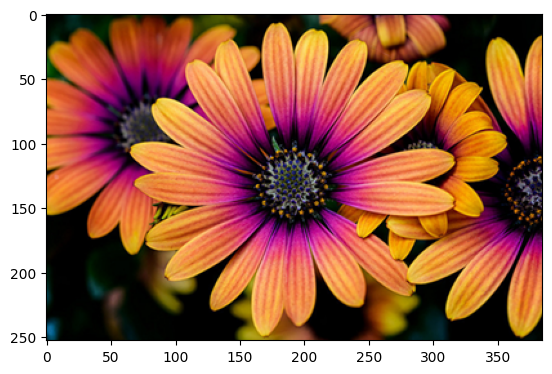

In [37]:
# Imagen de entrada (BGR)
bgr = cv2.imread('image.png')

print(f'El tamaño de la imagen es: {bgr.shape}')

# Conviertir BGR a RGB para mostrar con matplotlib
rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

# Muestra la imagen
plt.imshow(rgb)

In [38]:
# Lectura de píxeles de la imagen
pixel = bgr[150, 75]
print(f'El valor del pixel en la posición (100, 75) es: {pixel}')

El valor del pixel en la posición (100, 75) es: [ 70 130 242]


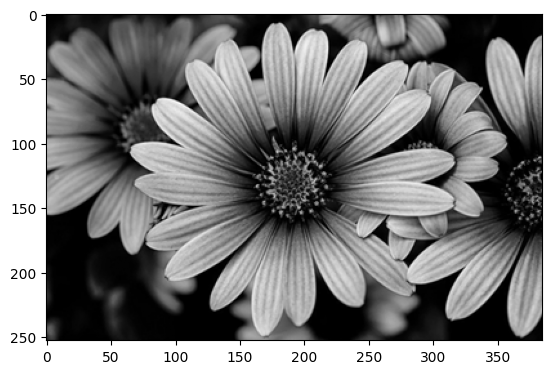

In [39]:
# Cambio a escala de grises
gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)

# Guardar la imagen en escala de grises
cv2.imwrite("image_gray.png", gray)

# Muestra la imagen en escala de grises
plt.imshow(gray, cmap='gray')

Text(0.5, 1.0, 'Canal Rojo')

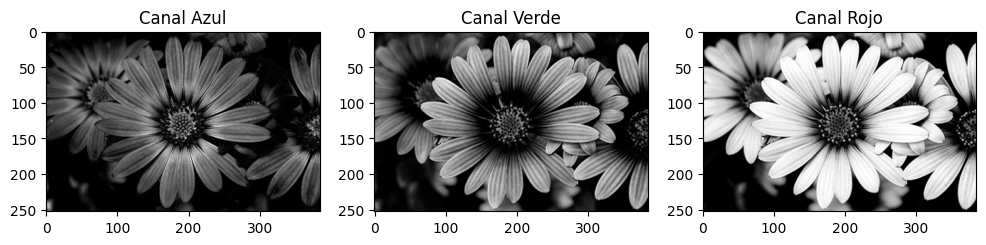

In [40]:
# Muestra los componentes de color
blue_channel = bgr[:, :, 0]
green_channel = bgr[:, :, 1]
red_channel = bgr[:, :, 2]

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(blue_channel, cmap='gray')
plt.title('Canal Azul')
plt.subplot(1, 3, 2)
plt.imshow(green_channel, cmap='gray')
plt.title('Canal Verde')
plt.subplot(1, 3, 3)
plt.imshow(red_channel, cmap='gray')
plt.title('Canal Rojo')

Text(0.5, 1.0, 'Canal Value')

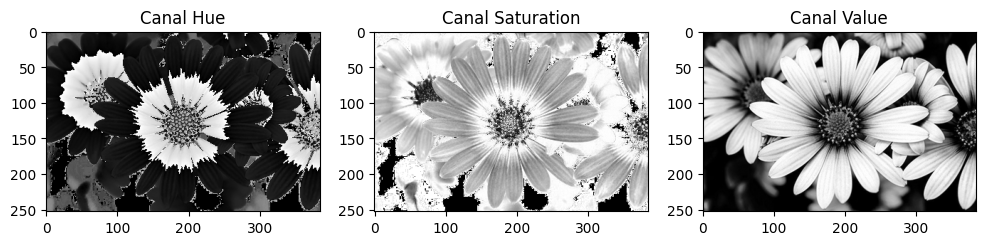

In [41]:
# Muestra los componentes HSV
hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)

hue_channel = hsv[:, :, 0]
saturation_channel = hsv[:, :, 1]
value_channel = hsv[:, :, 2]
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(hue_channel, cmap='gray')
plt.title('Canal Hue')
plt.subplot(1, 3, 2)    
plt.imshow(saturation_channel, cmap='gray')
plt.title('Canal Saturation')
plt.subplot(1, 3, 3)
plt.imshow(value_channel, cmap='gray')
plt.title('Canal Value')

## Ajuste de brillo y contraste
Para ajustar tanto el brillo como el contraste, se puede utilizar la función convertScaleAbs. Dicha función permite indicar dos parámetros (alpha y beta), con los cuales se indica si se quiere más o menos constraste, asó como incrementar o decrementar el brillo.


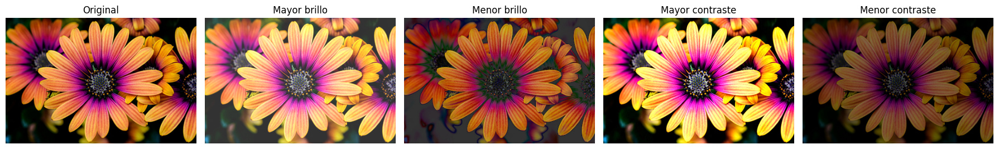

In [42]:
# Diferentes ejemplos
brillo_alto = cv2.convertScaleAbs(rgb, alpha=1.0, beta=50)   # más brillante
brillo_bajo = cv2.convertScaleAbs(rgb, alpha=1.0, beta=-50)  # más oscuro
contraste_alto = cv2.convertScaleAbs(rgb, alpha=1.5, beta=0) # más contraste
contraste_bajo = cv2.convertScaleAbs(rgb, alpha=0.5, beta=0) # menos contraste

# Mostrar resultados
fig, axes = plt.subplots(1, 5, figsize=(18, 5))

axes[0].imshow(rgb)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(brillo_alto)
axes[1].set_title("Mayor brillo")
axes[1].axis("off")

axes[2].imshow(brillo_bajo)
axes[2].set_title("Menor brillo")
axes[2].axis("off")

axes[3].imshow(contraste_alto)
axes[3].set_title("Mayor contraste")
axes[3].axis("off")

axes[4].imshow(contraste_bajo)
axes[4].set_title("Menor contraste")
axes[4].axis("off")

plt.tight_layout()
plt.show()

# Filtrado
La operación de filtrado permite reducir el ruido de la imagen. Existen diversas técnicas de filtrado, desde aquellas basadas en la convolución, hasta filtros no lineales en las que se aplican diversas técnicas.

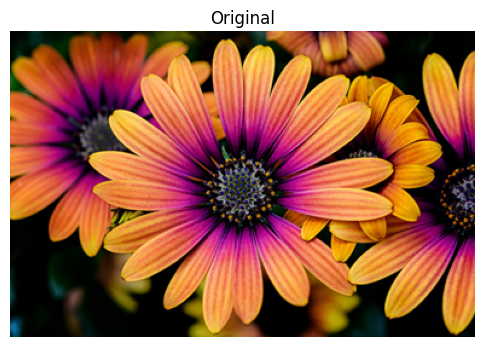

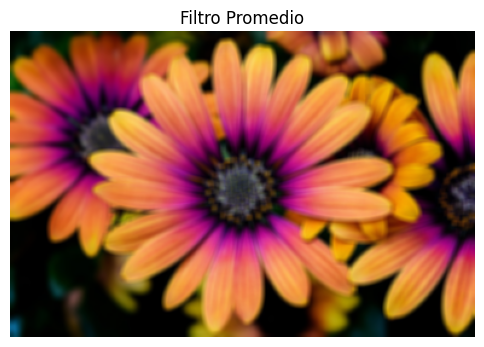

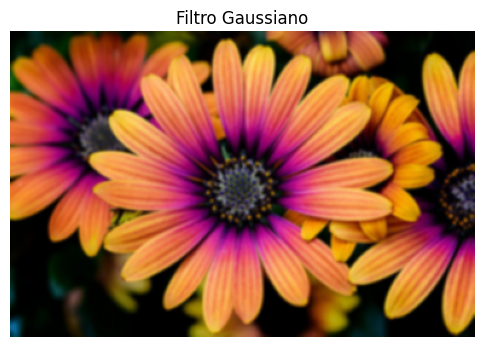

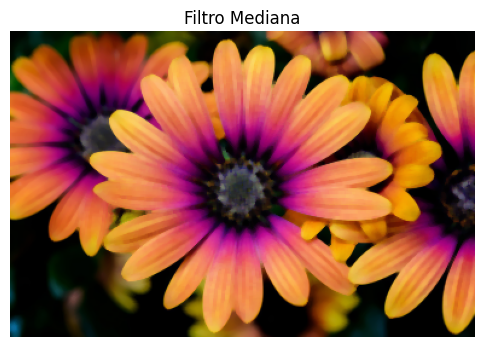

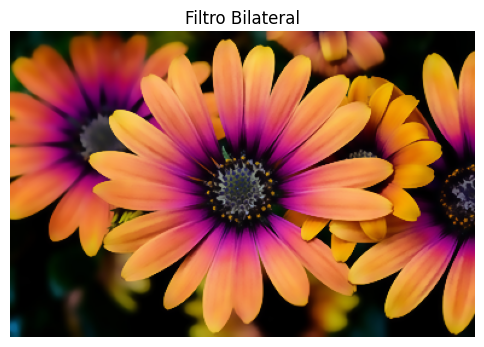

In [43]:
# Filtros comunes en OpenCV
blur = cv2.blur(rgb, (5, 5))                     # Promedio simple
gaussian = cv2.GaussianBlur(rgb, (5, 5), 0)      # Filtro Gaussiano
median = cv2.medianBlur(rgb, 5)                  # Filtro de Mediana
bilateral = cv2.bilateralFilter(rgb, 9, 75, 75)  # Filtro Bilateral (preserva bordes)

# Original
figsize = (6, 6)

plt.figure(figsize=figsize)
plt.imshow(rgb)
plt.title("Original")
plt.axis("off")
plt.show()

# Filtro Promedio
plt.figure(figsize=figsize)
plt.imshow(blur)
plt.title("Filtro Promedio")
plt.axis("off")
plt.show()

# Filtro Gaussiano
plt.figure(figsize=figsize)
plt.imshow(gaussian)
plt.title("Filtro Gaussiano")
plt.axis("off")
plt.show()

# Filtro Mediana
plt.figure(figsize=figsize)
plt.imshow(median)
plt.title("Filtro Mediana")
plt.axis("off")
plt.show()

# Filtro Bilateral
plt.figure(figsize=figsize)
plt.imshow(bilateral)
plt.title("Filtro Bilateral")
plt.axis("off")
plt.show()

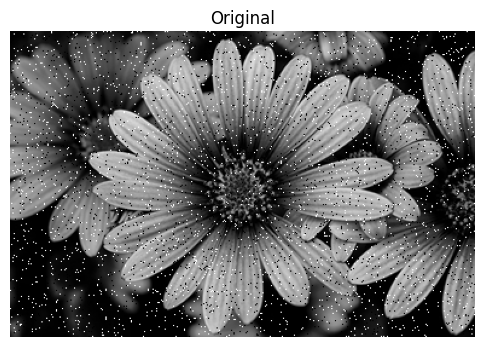

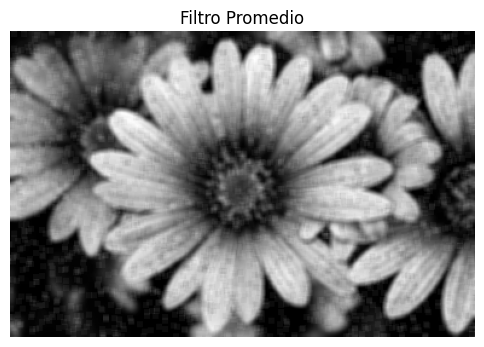

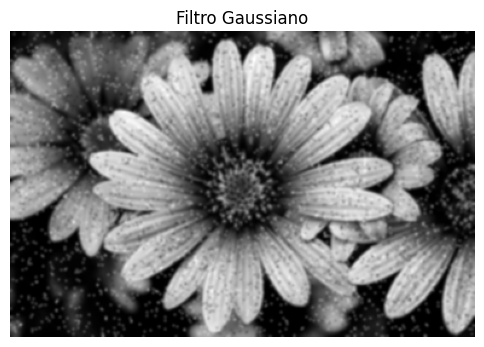

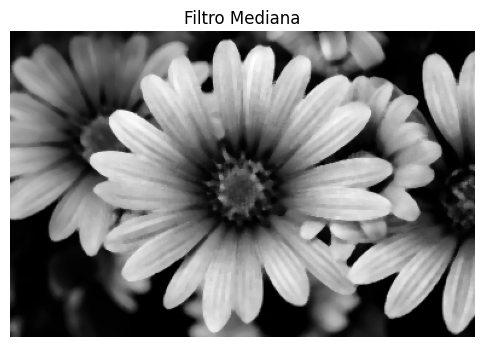

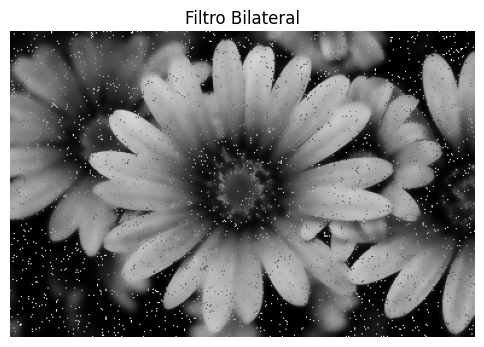

In [44]:
# Agrega ruido a la imagen para probar los filtros
def agregar_ruido_salt_and_pepper(image, prob):
    """
    Agrega ruido de sal y pimienta a una imagen.
    
    Parámetros:
    image: Imagen de entrada (numpy array).
    prob: Probabilidad de que un píxel se convierta en ruido.
    
    Retorna:
    Imagen con ruido agregado.
    """
    output = np.copy(image)
    black = 0
    white = 255
    probs = np.random.rand(*image.shape[:2])
    
    output[probs < (prob / 2)] = black
    output[probs > 1 - (prob / 2)] = white
    
    return output   

# Agregar ruido de sal y pimienta
noisy_image = agregar_ruido_salt_and_pepper(cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY), 0.05)

# Aplicar filtros a la imagen con ruido
blur_noisy = cv2.blur(noisy_image, (5, 5))                     # Promedio simple
gaussian_noisy = cv2.GaussianBlur(noisy_image, (5, 5), 0)      # Filtro Gaussiano
median_noisy = cv2.medianBlur(noisy_image, 5)                  # Filtro de Mediana
bilateral_noisy = cv2.bilateralFilter(noisy_image, 9, 75, 75)  # Filtro Bilateral (preserva bordes)

# Original
figsize = (6, 6)

plt.figure(figsize=figsize)
plt.imshow(noisy_image, cmap='gray')
plt.title("Original")
plt.axis("off")
plt.show()

# Filtro Promedio
plt.figure(figsize=figsize)
plt.imshow(blur_noisy, cmap='gray')
plt.title("Filtro Promedio")
plt.axis("off")
plt.show()

# Filtro Gaussiano
plt.figure(figsize=figsize)
plt.imshow(gaussian_noisy, cmap='gray')
plt.title("Filtro Gaussiano")
plt.axis("off")
plt.show()

# Filtro Mediana
plt.figure(figsize=figsize)
plt.imshow(median_noisy, cmap='gray')
plt.title("Filtro Mediana")
plt.axis("off")
plt.show()

# Filtro Bilateral
plt.figure(figsize=figsize)
plt.imshow(bilateral_noisy, cmap='gray')
plt.title("Filtro Bilateral")
plt.axis("off")
plt.show()

## Transformaciones geométricas
Las transformaciones geométricas permiten redimensionar una imagen, rotarla, invertirla, etc. Para cada una de estas operaciones hay una función específica en OpenCV.

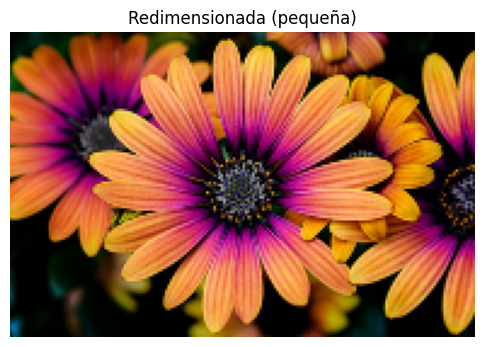

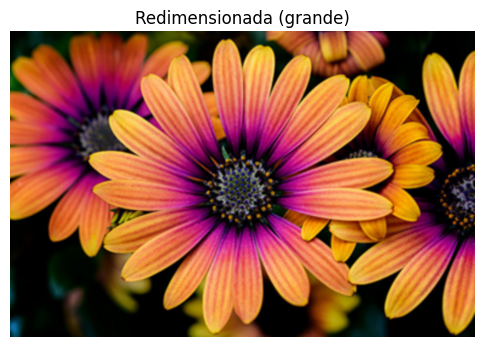

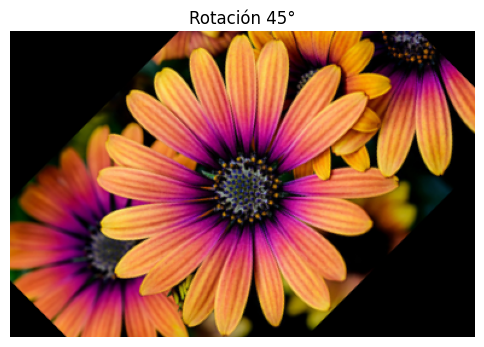

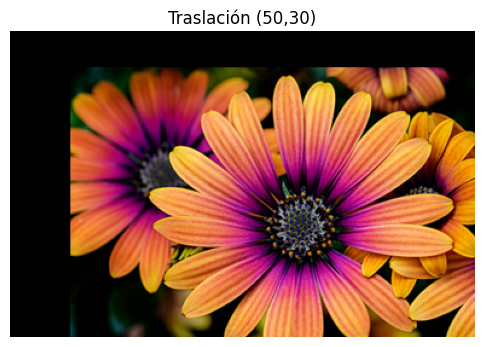

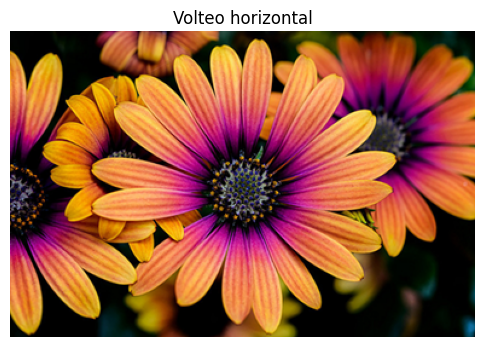

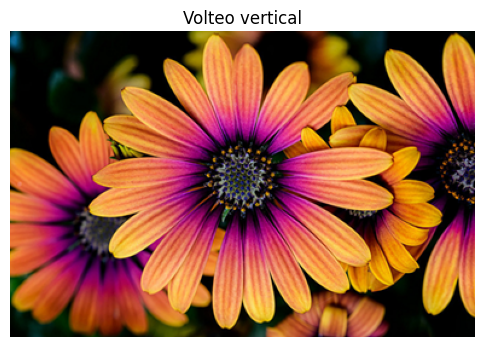

In [45]:
# Obtener dimensiones de la imagen
h, w = rgb.shape[:2]

# 1. Redimensionar
resize_small = cv2.resize(rgb, (w//2, h//2))
resize_large = cv2.resize(rgb, (w*2, h*2))

# 2. Rotación (45° alrededor del centro)
M_rot = cv2.getRotationMatrix2D((w//2, h//2), 45, 1.0)
rotated = cv2.warpAffine(rgb, M_rot, (w, h))

# 3. Traslación (mover 50 px en x y 30 en y)
M_trans = np.float32([[1, 0, 50], [0, 1, 30]])
translated = cv2.warpAffine(rgb, M_trans, (w, h))

# 4. Volteo horizontal y vertical
flip_h = cv2.flip(rgb, 1)  # horizontal
flip_v = cv2.flip(rgb, 0)  # vertical

# Mostrar cada transformación en imágenes separadas
figsize = (6, 6)

# Redimensionado pequeño
plt.figure(figsize=figsize)
plt.imshow(resize_small)
plt.title("Redimensionada (pequeña)")
plt.axis("off")
plt.show()

# Redimensionado grande
plt.figure(figsize=figsize)
plt.imshow(resize_large)
plt.title("Redimensionada (grande)")
plt.axis("off")
plt.show()

# Rotada
plt.figure(figsize=figsize)
plt.imshow(rotated)
plt.title("Rotación 45°")
plt.axis("off")
plt.show()

# Trasladada
plt.figure(figsize=figsize)
plt.imshow(translated)
plt.title("Traslación (50,30)")
plt.axis("off")
plt.show()

# Volteo horizontal
plt.figure(figsize=figsize)
plt.imshow(flip_h)
plt.title("Volteo horizontal")
plt.axis("off")
plt.show()

# Volteo vertical
plt.figure(figsize=figsize)
plt.imshow(flip_v)
plt.title("Volteo vertical")
plt.axis("off")
plt.show()

## Detección de bordes y esquinas
Tanto los bordes como la esquinas de una imagen suelen proporcionar información relevante sobre los objetos en la imagen. Por ello, hay diversos métodos implementados en OpenCV para extraer dicha informaión.

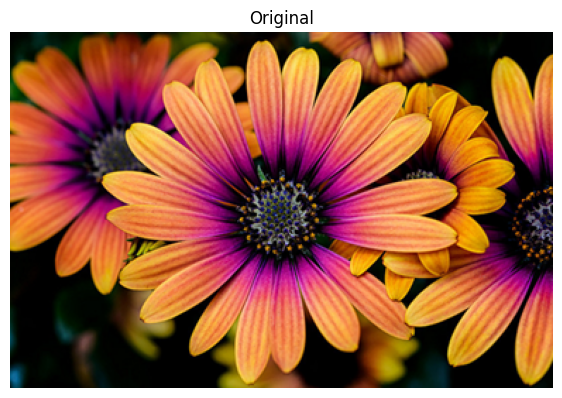

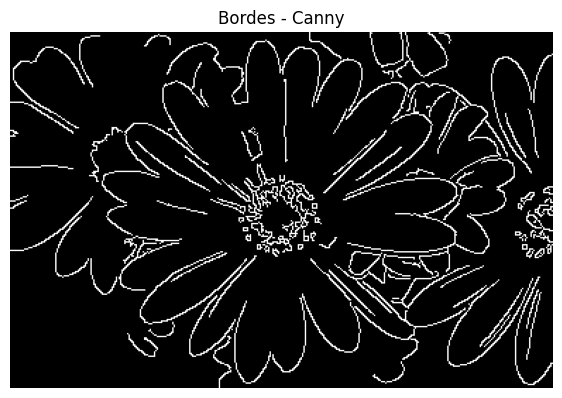

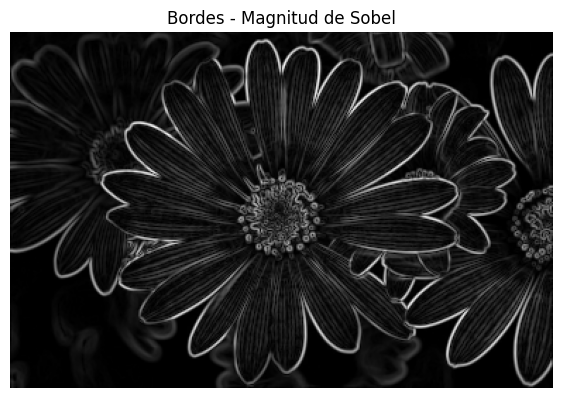

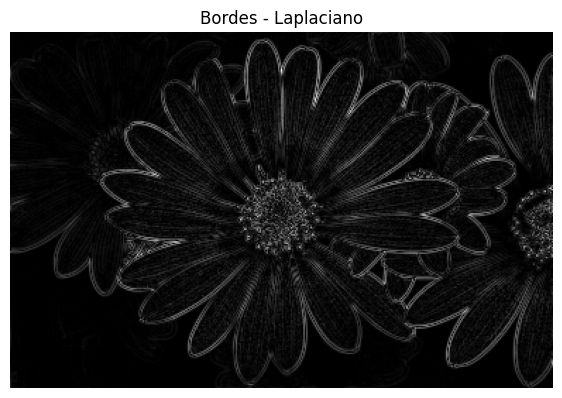

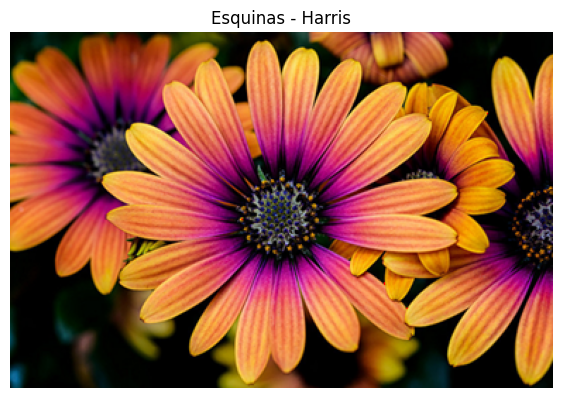

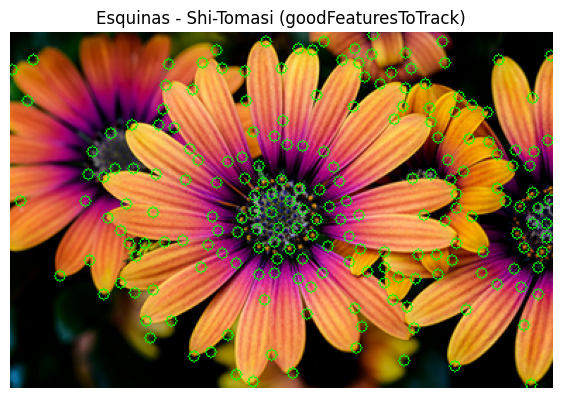

In [46]:
gray_blur = cv2.GaussianBlur(gray, (5,5), 1.0)

# Canny
canny = cv2.Canny(gray_blur, threshold1=100, threshold2=200)

# Sobel (gradientes en X y Y) y magnitud
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
mag = cv2.magnitude(sobelx, sobely)
mag_uint8 = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Laplaciano
lap = cv2.Laplacian(gray, cv2.CV_64F, ksize=3)
lap_uint8 = cv2.normalize(np.abs(lap), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- ESQUINAS ---
# Harris
gray_float = np.float32(gray)
harris = cv2.cornerHarris(gray_float, blockSize=2, ksize=3, k=0.04)
harris_norm = cv2.normalize(harris, None, 0, 255, cv2.NORM_MINMAX)
harris_img = rgb.copy()
harris_img[harris_norm > 180] = [255, 0, 0]  # marcar en rojo (por defecto)

# Shi-Tomasi (Good Features to Track)
shi_img = rgb.copy()
shi_corners = cv2.goodFeaturesToTrack(gray, maxCorners=200, qualityLevel=0.01, minDistance=10)
if shi_corners is not None:
    for c in shi_corners:
        x, y = c.ravel()
        cv2.circle(shi_img, (int(x), int(y)), 4, (0, 255, 0), 1)



# Mostrar resultados en figuras separadas y grandes
figsize = (7, 7)

plt.figure(figsize=figsize)
plt.imshow(rgb)
plt.title("Original")
plt.axis("off")
plt.show()

plt.figure(figsize=figsize)
plt.imshow(canny, cmap="gray")
plt.title("Bordes - Canny")
plt.axis("off")
plt.show()

plt.figure(figsize=figsize)
plt.imshow(mag_uint8, cmap="gray")
plt.title("Bordes - Magnitud de Sobel")
plt.axis("off")
plt.show()

plt.figure(figsize=figsize)
plt.imshow(lap_uint8, cmap="gray")
plt.title("Bordes - Laplaciano")
plt.axis("off")
plt.show()

plt.figure(figsize=figsize)
plt.imshow(harris_img)
plt.title("Esquinas - Harris")
plt.axis("off")
plt.show()

plt.figure(figsize=figsize)
plt.imshow(shi_img)
plt.title("Esquinas - Shi-Tomasi (goodFeaturesToTrack)")
plt.axis("off")
plt.show()

## Detección de puntos clave
Los puntos clave de una imagen son posiciones que potencialmente contienen información relevante de la imagen. Estos se utilizan para tareas de reconocimiento y clasificación de regiones e imágenes.

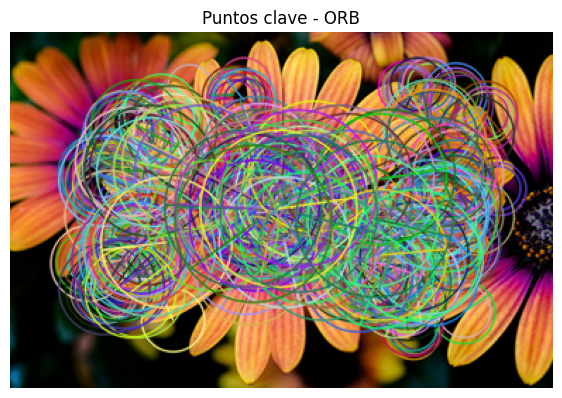

In [47]:
# ORB (keypoints y corners robustos)
orb = cv2.ORB_create(nfeatures=500)
kps = orb.detect(gray, None)
kps, des = orb.compute(gray, kps)
orb_img = cv2.drawKeypoints(rgb, kps, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=figsize)
plt.imshow(orb_img)
plt.title("Puntos clave - ORB")
plt.axis("off")
plt.show()

## Detección de formas
Otra operación importantees la detección de formas simples como círculos, elipses, rectángulos, polígonos, etc. 

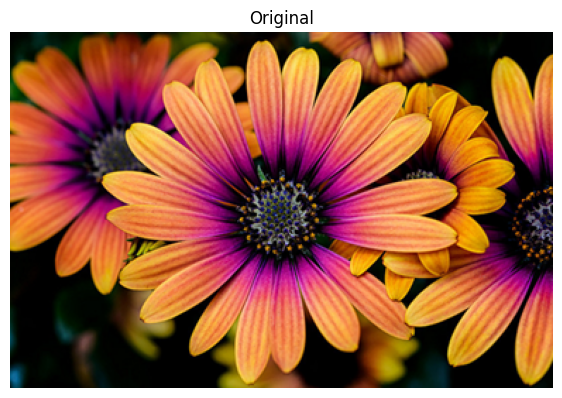

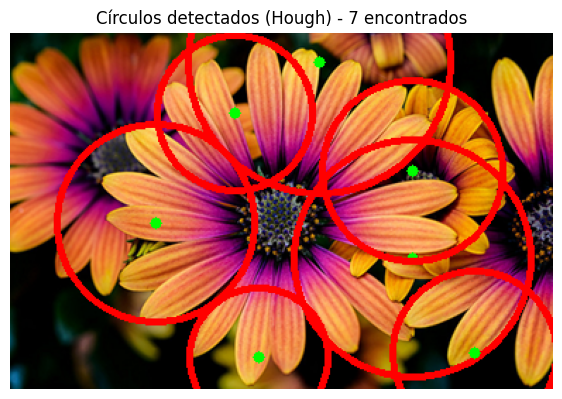

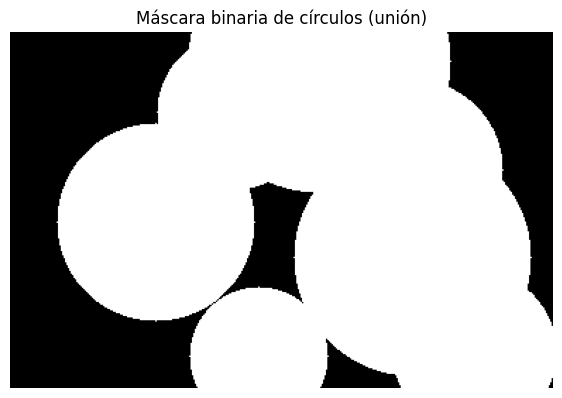

In [48]:
# Preproceso: suavizado para reducir ruido
gray_blur = cv2.GaussianBlur(gray, (9, 9), 2)

# Hough Circle Transform (parámetros ajustados empíricamente para esta imagen)
circles = cv2.HoughCircles(
    gray_blur,
    cv2.HOUGH_GRADIENT,
    dp=1.2,           # resolución del acumulador
    minDist=60,       # distancia mínima entre centros
    param1=120,       # umbral superior para Canny interno
    param2=40,        # umbral del acumulador (más alto = menos detecciones)
    minRadius=20,     # radio mínimo esperado del disco central de la flor
    maxRadius=200     # radio máximo
)

overlay = rgb.copy()
mask = np.zeros_like(gray)

det_count = 0
if circles is not None:
    circles = np.uint16(np.around(circles[0, :]))
    det_count = len(circles)
    for (x, y, r) in circles:
        # círculo externo (borde)
        cv2.circle(overlay, (x, y), r, (255, 0, 0), 3)
        # centro
        cv2.circle(overlay, (x, y), 4, (0, 255, 0), -1)
        # máscara (disco)
        cv2.circle(mask, (x, y), r, 255, -1)

# Mostrar resultados
figsize=(7,7)

plt.figure(figsize=figsize)
plt.imshow(rgb)
plt.title("Original")
plt.axis("off")
plt.show()

plt.figure(figsize=figsize)
plt.imshow(overlay)
plt.title(f"Círculos detectados (Hough) - {det_count} encontrados")
plt.axis("off")
plt.show()

plt.figure(figsize=figsize)
plt.imshow(mask, cmap="gray")
plt.title("Máscara binaria de círculos (unión)")
plt.axis("off")
plt.show()

## Segmentación
La segmentación de imágenes permite identificar los píxeles o áreas que pertenecen a un objeto o región de la imagen. La segmentación suele ser una operación previa a muchas otras técnicas de visión computacional, ya que permite aislar los elementos de la imagen.

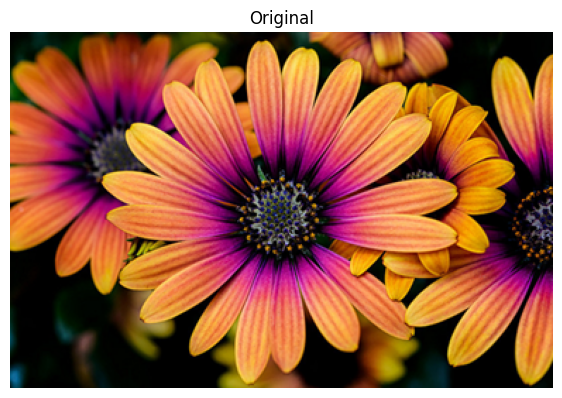

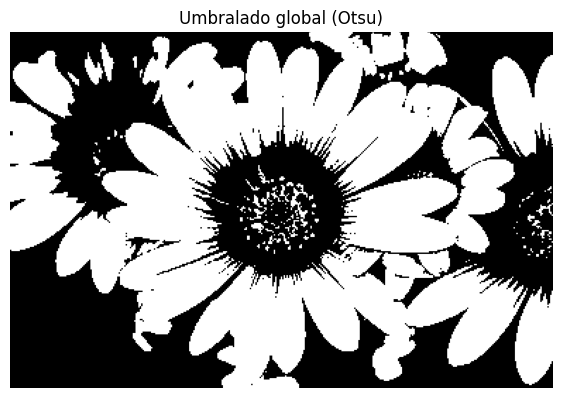

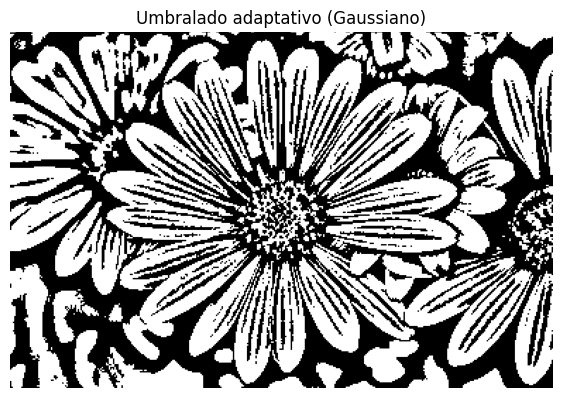

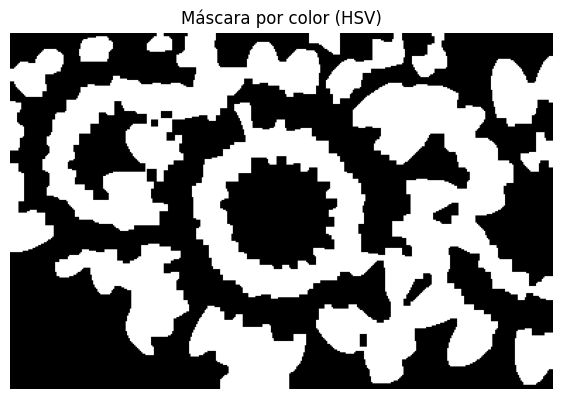

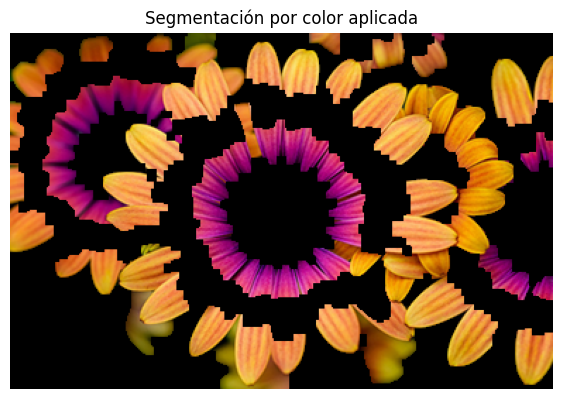

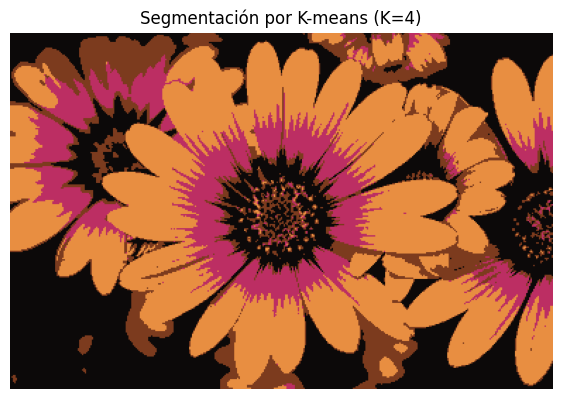

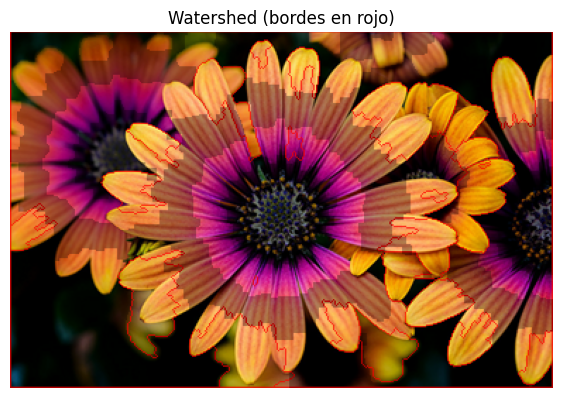

In [49]:
# -------------------------------
# 1) Umbralado (Thresholding)
# -------------------------------
# Otsu (global)
_, thr_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Adaptativo
thr_adapt = cv2.adaptiveThreshold(
    gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 35, 2
)


# -------------------------------
# 2) Segmentación por color (HSV)
# -------------------------------
# Rangos para pétalos magenta/morado y amarillo/naranja en HSV de OpenCV (H: 0-179)
# Ajustes prácticos para esta foto (puedes refinarlos en clase)
lower_mag = np.array([125, 80, 70])
upper_mag = np.array([175, 255, 255])
lower_yel = np.array([10,  60, 70])
upper_yel = np.array([40, 255, 255])

mask_mag = cv2.inRange(hsv, lower_mag, upper_mag)
mask_yel = cv2.inRange(hsv, lower_yel, upper_yel)
mask_hsv = cv2.bitwise_or(mask_mag, mask_yel)

# Limpieza morfológica
kernel = np.ones((5,5), np.uint8)
mask_hsv_clean = cv2.morphologyEx(mask_hsv, cv2.MORPH_OPEN, kernel, iterations=1)
mask_hsv_clean = cv2.morphologyEx(mask_hsv_clean, cv2.MORPH_CLOSE, kernel, iterations=1)

seg_hsv = cv2.bitwise_and(rgb, rgb, mask=mask_hsv_clean)

# -------------------------------
# 3) K-means (clustering de color)
# -------------------------------
Z = bgr.reshape((-1,3)).astype(np.float32)
K = 4
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 1.0)
compactness, labels, centers = cv2.kmeans(Z, K, None, criteria, 3, cv2.KMEANS_PP_CENTERS)
centers = centers.astype(np.uint8)
seg_kmeans_bgr = centers[labels.flatten()].reshape(bgr.shape)
seg_kmeans = cv2.cvtColor(seg_kmeans_bgr, cv2.COLOR_BGR2RGB)

# -------------------------------
# 4) Watershed (separación de regiones)
# -------------------------------
# Usamos la máscara por color como base de primer plano
mask = mask_hsv_clean

# Fondo seguro (sure background) por dilatación
sure_bg = cv2.dilate(mask, kernel, iterations=2)

# Primer plano seguro (sure foreground) por distancia + umbral
dist = cv2.distanceTransform(mask, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(dist, 0.5 * dist.max(), 255, 0)
sure_fg = sure_fg.astype(np.uint8)

# Área desconocida
unknown = cv2.subtract(sure_bg, sure_fg)

# Marcadores para watershed
num_markers, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1  # que el fondo sea 1 en lugar de 0
markers[unknown == 255] = 0

# Aplicar watershed (requiere BGR)
ws_input = bgr.copy()
markers_ws = cv2.watershed(ws_input, markers.copy())

# Visualización: contornos (borde = -1)
ws_overlay = rgb.copy()
ws_overlay[markers_ws == -1] = [255, 0, 0]  # marcas de borde
# También coloreamos regiones segmentadas atenuando fondo
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
ws_show = (ws_overlay * 0.7 + (rgb * (mask_rgb>0)) * 0.3).astype(np.uint8)


# -------------------------------
# Mostrar resultados (figuras separadas y grandes)
# -------------------------------
figsize = (7, 7)

plt.figure(figsize=figsize)
plt.imshow(rgb); plt.title("Original"); plt.axis("off"); plt.show()

plt.figure(figsize=figsize)
plt.imshow(thr_otsu, cmap="gray"); plt.title("Umbralado global (Otsu)"); plt.axis("off"); plt.show()

plt.figure(figsize=figsize)
plt.imshow(thr_adapt, cmap="gray"); plt.title("Umbralado adaptativo (Gaussiano)"); plt.axis("off"); plt.show()

plt.figure(figsize=figsize)
plt.imshow(mask_hsv_clean, cmap="gray"); plt.title("Máscara por color (HSV)"); plt.axis("off"); plt.show()

plt.figure(figsize=figsize)
plt.imshow(seg_hsv); plt.title("Segmentación por color aplicada"); plt.axis("off"); plt.show()

plt.figure(figsize=figsize)
plt.imshow(seg_kmeans); plt.title("Segmentación por K-means (K=4)"); plt.axis("off"); plt.show()

plt.figure(figsize=figsize)
plt.imshow(ws_show); plt.title("Watershed (bordes en rojo)"); plt.axis("off"); plt.show()